In [10]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd
from datetime import datetime
import matplotlib.pyplot as plt

In [11]:
# Load geodata
geography = gpd.read_parquet("../data/interim/geographic-dataset.parquet")[['CD_MUN', 'geometry']]
# Load imputed data
imputed_data = pd.read_parquet('DENV-serotypes-imputed_1996-2025_monthly.parquet')

In [12]:
# Limit date range
imputed_data = imputed_data[((imputed_data['date'] >= datetime(1996,1,1)) & (imputed_data['date'] <= datetime(2025,1,1)))] 
# Compute DENV_1 incidence per 100 K
for i in range(1,5):
    imputed_data[f'DENV_{i}'] = imputed_data[f'p_{i}']
# Extract the daterange
dates = imputed_data['date'].unique()

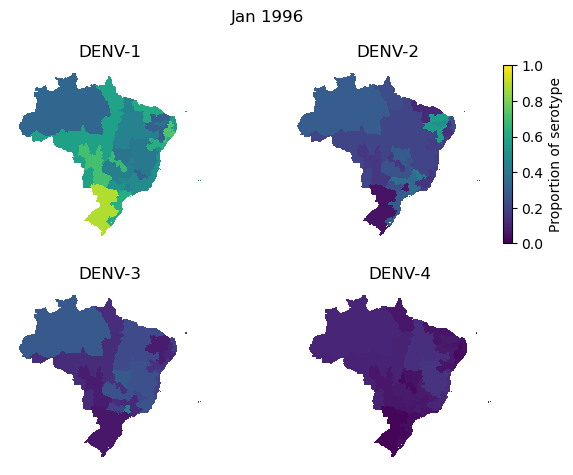

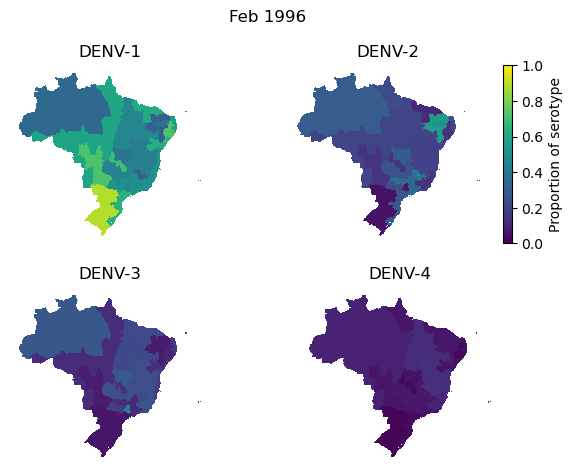

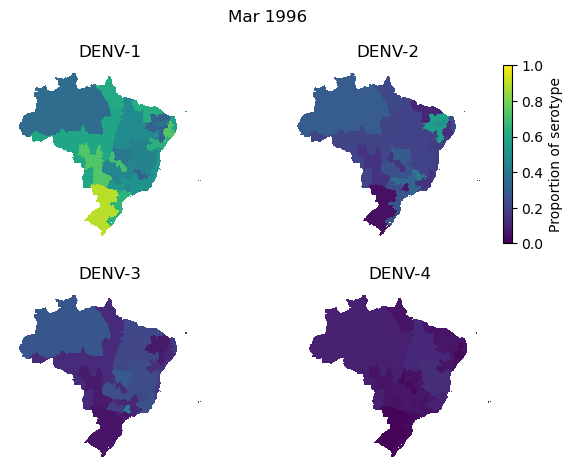

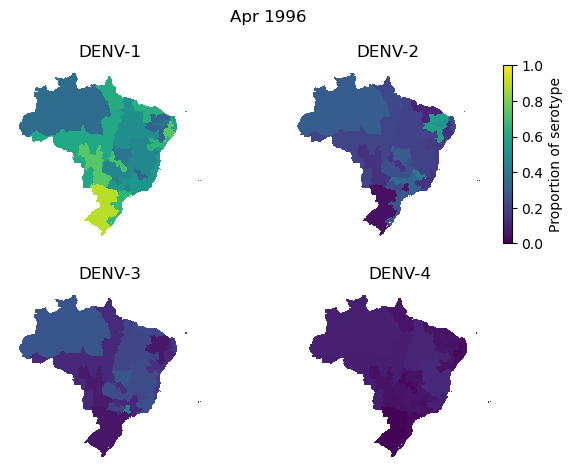

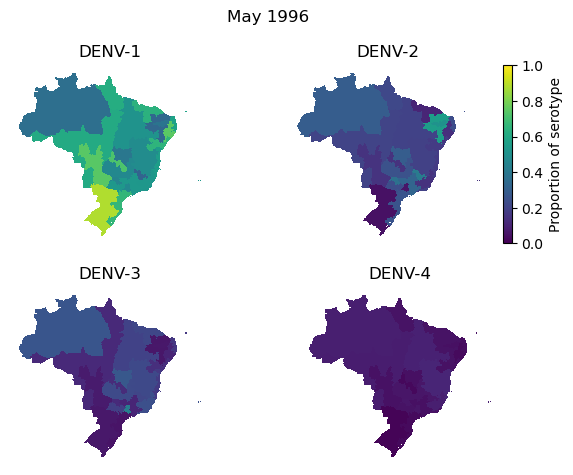

...

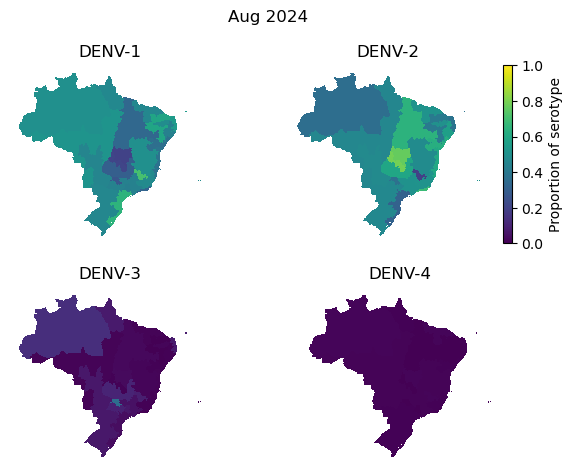

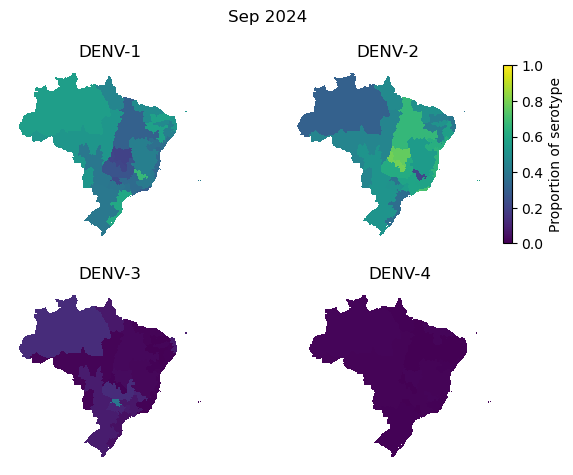

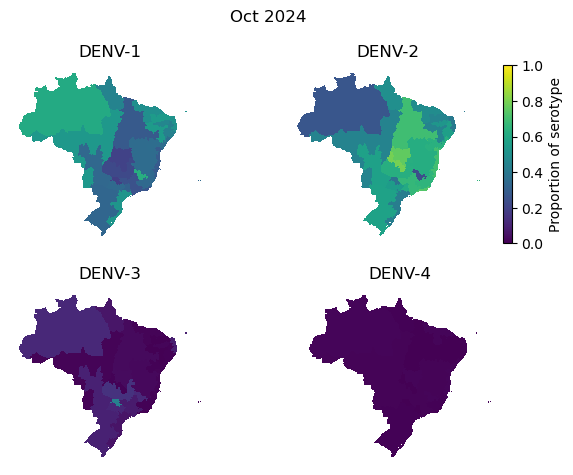

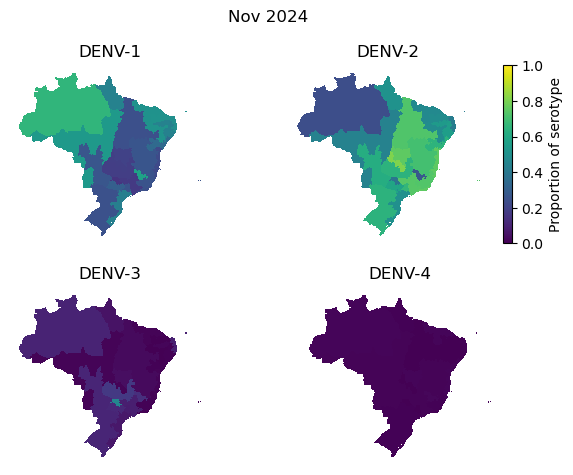

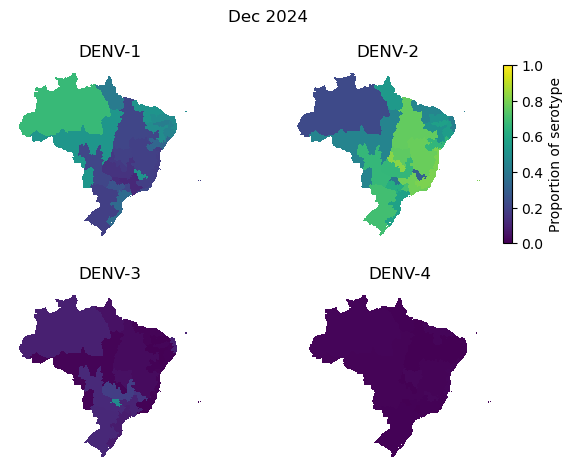

In [13]:
output_dir = 'frames'

for i, date in enumerate(dates):
    
    # Extract incidence per 100K
    slc = imputed_data[imputed_data['date']==date][['CD_MUN', 'DENV_1', 'DENV_2', 'DENV_3', 'DENV_4']].fillna(1e-6)

    # Add to geography
    geography_tmp = geography.merge(slc[['CD_MUN', 'DENV_1', 'DENV_2', 'DENV_3', 'DENV_4']], on='CD_MUN', how='left')

    # Make a figure
    fig, axes = plt.subplots(nrows=2, ncols=2)
    for j, ax in enumerate(axes.flatten()):
        # show the legend?
        show_legend = (j == 1)
        # plot
        geography_tmp.plot(
            column=f"DENV_{j+1}",          # color regions by cluster label
            categorical=False,
            cmap='viridis',             # categorical colormap
            linewidth=0,
            edgecolor=None,
            antialiased=False,
            legend=show_legend,
            legend_kwds={'label': "Proportion of serotype"},
            ax=ax,
            vmin=0,
            vmax=1
        )
        ax.axis("off")
        ax.set_title(f"DENV-{j+1}")
    plt.suptitle(date.strftime("%b %Y"))
    plt.tight_layout()
    plt.savefig(f"{output_dir}/frame_{i:03d}.png", dpi=150)
    plt.show()
    plt.close()

In [15]:
import imageio.v2 as imageio
import glob

frames = sorted(glob.glob(f"{output_dir}/frame_*.png"))
images = [imageio.imread(f) for f in frames]
imageio.mimsave("dengue_animation.mp4", images, fps=8)